In [1]:
#%matplotlib notebook
import sys
import os

# Standard modules used through the notebook 
import numpy as np
import matplotlib.pyplot as plt

# tools for applying bundle adjustment to a temporal sequence of satellite images
import bundle_adjust.ba_timeseries as ba_timeseries

# Display and interface settings (just for the notebook interface)
%matplotlib inline
%load_ext autoreload
%autoreload 2
np.set_printoptions(linewidth=150)

### Load scene

In [3]:
scene = ba_timeseries.Scene('coal_ba_config.json')
scene.display_aoi()


###################################################################################

Loading scene from coal_ba_config.json

-------------------------------------------------------------
Configuration:
    - geotiff_dir:      /home/carlo/dsms-timeseries-for-roger/RB_ZAF_0001/RB_ZAF_0001_images
    - s2p_configs_dir:  /home/carlo/dsms-timeseries-for-roger/RB_ZAF_0001/RB_ZAF_0001_s2p
    - rpc_src:          s2p_configs
    - output_dir:       exp/coal
    - cam_model:        perspective
-------------------------------------------------------------

Defining aoi from s2p config.json files... 541/541

Number of acquisition dates: 85 (from 2019-06-08 to 2020-05-06)
Number of images: 560
The aoi covers a surface of 1.03 squared km

###################################################################################




Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

### Select date(s) of the scene to adjust

In [55]:
# 8 acquisition dates separed by around a week in time [0, 3, 4, 8, 9, 12, 15, 16]

good_dates = [0, 6, 7, 8, 9, 11, 13, 15, 16, 20, 22, 24, 27, 28, 32, 36, 46, 
              51, 53, 54, 55, 58, 60, 61, 62, 65, 66, 68, 69, 70, 71, 72, 73, 74, 77, 78, 80, 81, 82, 83, 84]
cloudy = [17, 38, 42, 44, 50, 52, 56, 57, 59, 63, 64, 67, 75, 76, 79]
rpc_crashes = [1, 2, 5, 10, 18, 35, 37, 49]
rpc_cant_be_approx_as_P = [3, 4, 12, 14, 19, 21, 23, 25, 26, 29, 30, 31, 33, 34, 39, 40, 41, 43, 45, 47, 48]

timeline_indices = np.array(good_dates)[np.array(good_dates) > 50].tolist()

timeline_indices = timeline_indices[0:2]
scene.get_timeline_attributes(timeline_indices, ['datetime', 'n_images', 'id'])

index  |  datetime             |  n_images  |  id             
______________________________________________________________

51     |  2020-01-16 07:55:31  |  7         |  20200116_075531
53     |  2020-01-29 10:38:23  |  6         |  20200129_103823
______________________________________________________________

                                  13 total                    




### Feature tracking configuration

In [9]:
scene.tracks_config

{'FT_preprocess': False,
 'FT_preprocess_aoi': False,
 'FT_sift_detection': 's2p',
 'FT_sift_matching': 'epipolar_based',
 'FT_rel_thr': 0.6,
 'FT_abs_thr': 250,
 'FT_ransac': 0.3,
 'FT_kp_max': 60000,
 'FT_kp_aoi': False,
 'FT_K': 0,
 'FT_priority': ['length', 'scale', 'cost'],
 'FT_predefined_pairs': [],
 'FT_filter_pairs': True,
 'FT_n_proc': 1,
 'FT_compress': False,
 'FT_reset': False}

### Bundle Adjustment

1 dates of the timeline were selected for bundle adjustment:
(1) 2020-01-29 10:38:23 --> 6 views

Running sequential bundle adjustment !
Each date aligned with 1 previous date(s)




Setting bundle adjustment input data...

No previously adjusted data was found in exp/coal

6 new images for bundle adjustment !
Loading rpcs... 6/6
Loading geotiff crops... 6/6

...bundle adjustment input data is ready !


Bundle Adjustment Pipeline created
-------------------------------------------------------------
Configuration:
    - input_dir:    exp/coal/ba_sequential
    - output_dir:   exp/coal/ba_sequential
    - n_new:        6
    - n_adj:        0
    - cam_model:    perspective
    - fix_ref_cam:  True
-------------------------------------------------------------

Perspective projection matrix approximation... 6/6


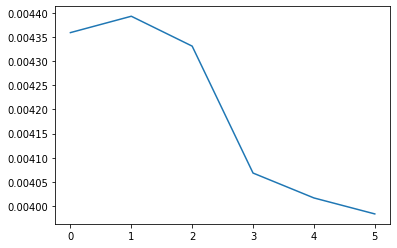

Estimating camera positions...
...done in 0.04 seconds
Getting image footprints...
...done in 0.62 seconds


Building feature tracks - satellite scenario

Parameters:
    - FT_preprocess:        False
    - FT_preprocess_aoi:    False
    - FT_sift_detection:    s2p
    - FT_sift_matching:     epipolar_based
    - FT_rel_thr:           0.6
    - FT_abs_thr:           250
    - FT_ransac:            0.3
    - FT_kp_max:            60000
    - FT_kp_aoi:            False
    - FT_K:                 0
    - FT_priority:          ['length', 'scale', 'cost']
    - FT_predefined_pairs:  []
    - FT_filter_pairs:      True
    - FT_n_proc:            1
    - FT_compress:          False
    - FT_reset:             False



Running feature detection...

27273 keypoints in image 0
32020 keypoints in image 1
55383 keypoints in image 2
59853 keypoints in image 3
42863 keypoints in image 4
38517 keypoints in image 5
All keypoints saved in 0.21 seconds (.npy format)

...done in 43.15 seconds

Comput

In [10]:
scene.run_sequential_bundle_adjustment(timeline_indices, previous_dates=1, fix_ref_cam=True, reset=True, verbose=True)

0 points (0.00%) with reprojection error above 1.00 pixels


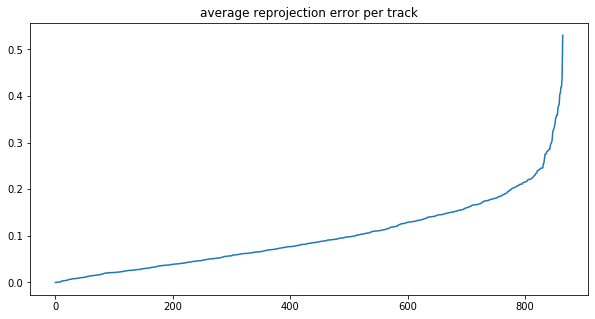

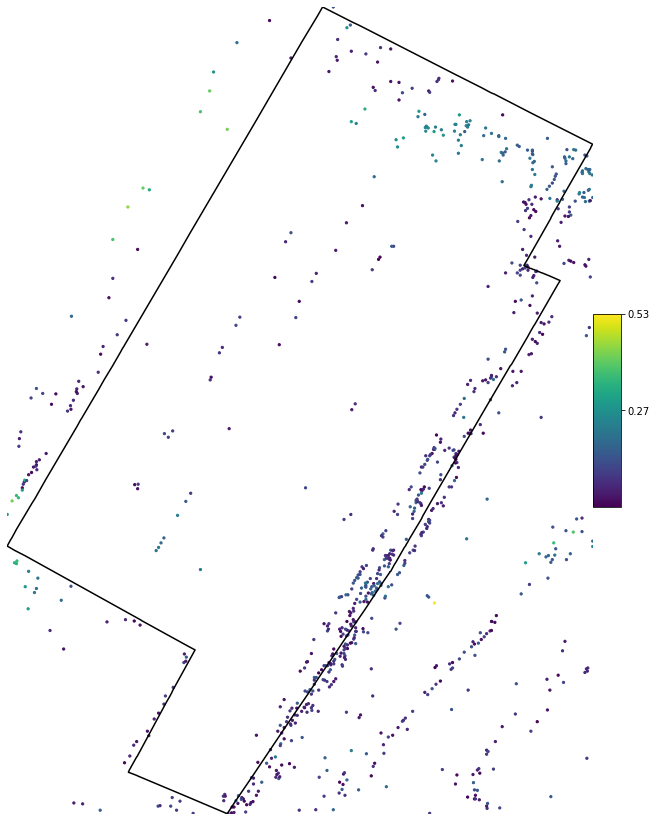

In [11]:
scene.ba_pipeline.plot_reprojection_error_over_aoi(before_ba=False, thr=1.0, s=5)

# new one

In [22]:
scene.run_sequential_bundle_adjustment(timeline_indices, previous_dates=1, fix_ref_cam=True, reset=True, verbose=True)

2 dates of the timeline were selected for bundle adjustment:
(1) 2020-01-16 07:55:31 --> 7 views
(2) 2020-01-29 10:38:23 --> 6 views

Running sequential bundle adjustment !
Each date aligned with 1 previous date(s)




Setting bundle adjustment input data...

No previously adjusted data was found in exp/coal

7 new images for bundle adjustment !
Loading rpcs... 7/7
Loading geotiff crops... 7/7

...bundle adjustment input data is ready !


Bundle Adjustment Pipeline created
-------------------------------------------------------------
Configuration:
    - input_dir:    exp/coal/ba_sequential
    - output_dir:   exp/coal/ba_sequential
    - n_new:        7
    - n_adj:        0
    - cam_model:    perspective
    - fix_ref_cam:  True
-------------------------------------------------------------

Perspective projection matrix approximation... 7/7
Estimating camera positions...
...done in 0.00 seconds
Getting image footprints...
...done in 0.54 seconds


Building feature tracks - satellite

Loading geotiff crops... 6/6

...bundle adjustment input data is ready !


Bundle Adjustment Pipeline created
-------------------------------------------------------------
Configuration:
    - input_dir:    exp/coal/ba_sequential
    - output_dir:   exp/coal/ba_sequential
    - n_new:        6
    - n_adj:        7
    - cam_model:    perspective
    - fix_ref_cam:  False
-------------------------------------------------------------

Perspective projection matrix approximation... 13/13
Estimating camera positions...
...done in 0.00 seconds
Getting image footprints...
...done in 0.63 seconds


Building feature tracks - satellite scenario

Parameters:
    - FT_preprocess:        False
    - FT_preprocess_aoi:    False
    - FT_sift_detection:    s2p
    - FT_sift_matching:     epipolar_based
    - FT_rel_thr:           0.6
    - FT_abs_thr:           250
    - FT_ransac:            0.3
    - FT_kp_max:            60000
    - FT_kp_aoi:            False
    - FT_K:                 0
    -

    - cam   8 -  1500 obs - (mean before / mean after): 4.88 / 0.15
    - cam   9 -  1789 obs - (mean before / mean after): 6.99 / 0.12
    - cam  10 -  1649 obs - (mean before / mean after): 2.47 / 0.10
    - cam  11 -   920 obs - (mean before / mean after): 2.84 / 0.11
    - cam  12 -  1276 obs - (mean before / mean after): 3.30 / 0.15


Optimization problem solved in 00:00:06.30 (59 iterations)



Bundle adjusted projection matrices written at exp/coal/ba_sequential/P_adj

cam  0 - RPC fit error per obs [1e-4 px] (max / avg): 0.63 / 0.27
cam  1 - RPC fit error per obs [1e-4 px] (max / avg): 1.45 / 0.28
cam  2 - RPC fit error per obs [1e-4 px] (max / avg): 0.96 / 0.30
cam  3 - RPC fit error per obs [1e-4 px] (max / avg): 0.65 / 0.27
cam  4 - RPC fit error per obs [1e-4 px] (max / avg): 1.18 / 0.25
cam  5 - RPC fit error per obs [1e-4 px] (max / avg): 0.80 / 0.26
cam  6 - RPC fit error per obs [1e-4 px] (max / avg): 0.90 / 0.26
cam  7 - RPC fit error per obs [1e-4 px] (max / avg): 1.1

3 points (0.07%) with reprojection error above 1.00 pixels


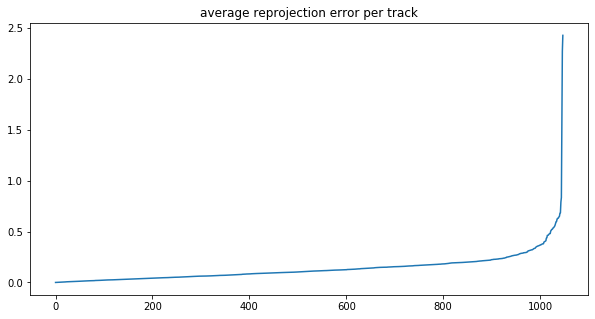

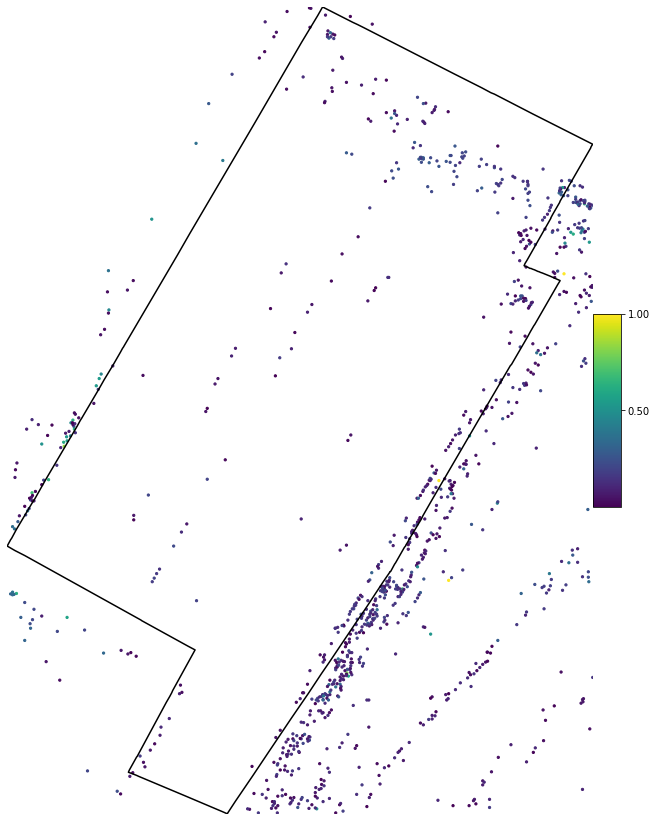

In [23]:
scene.ba_pipeline.plot_reprojection_error_over_aoi(before_ba=False, thr=1.0, s=5)

In [24]:
from bundle_adjust import geotools

idx = 1
a = geotools.lonlat_geojson_from_geotiff_crop(scene.ba_pipeline.input_rpcs[idx], scene.ba_pipeline.crop_offsets[idx])

geotools.display_lonlat_geojson_list_over_map([scene.aoi_lonlat, a])

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

path to image: /home/carlo/dsms-timeseries-for-roger/RB_ZAF_0001/RB_ZAF_0001_images/s4_20200116T075531Z__s4_20200116T075605Z__s4_20200116T075641Z/20200116_075605_ssc2d2_0017_basic_panchromatic_dn.tif
Reprojection error before BA (mean / median): 57.02 / 56.64
Reprojection error after  BA (mean / median): 0.17 / 0.13



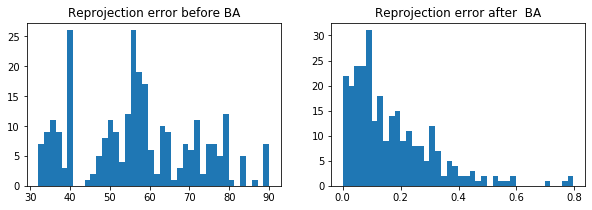

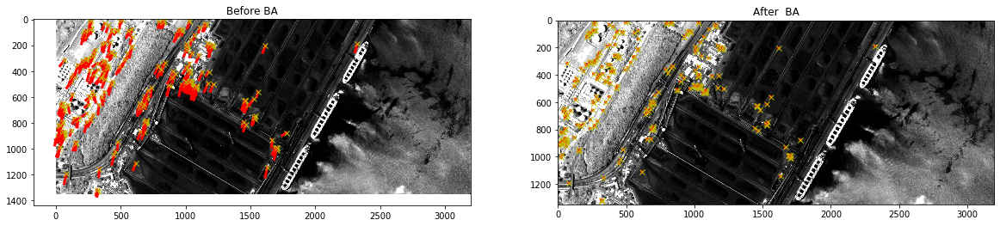

In [25]:
scene.ba_pipeline.analyse_reprojection_error_per_image(3)


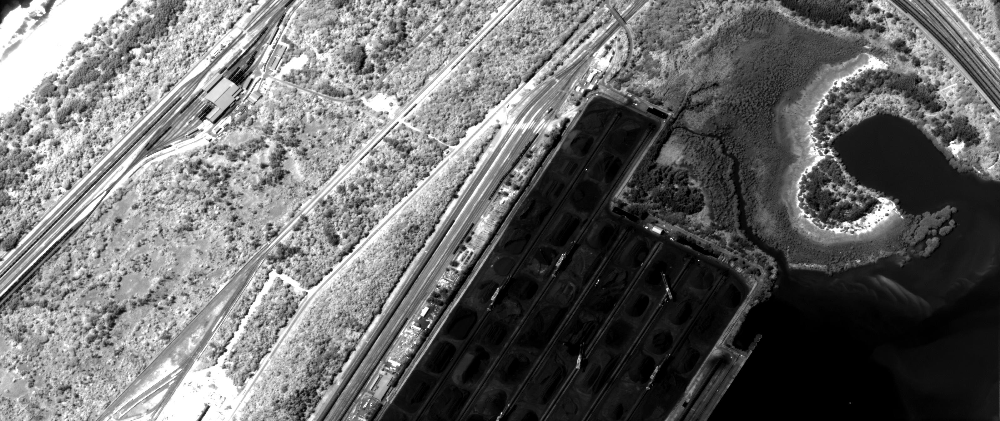
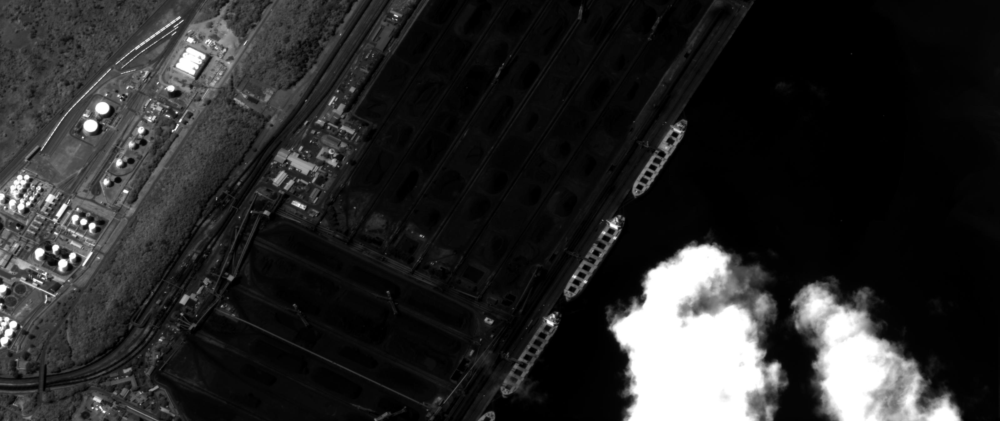
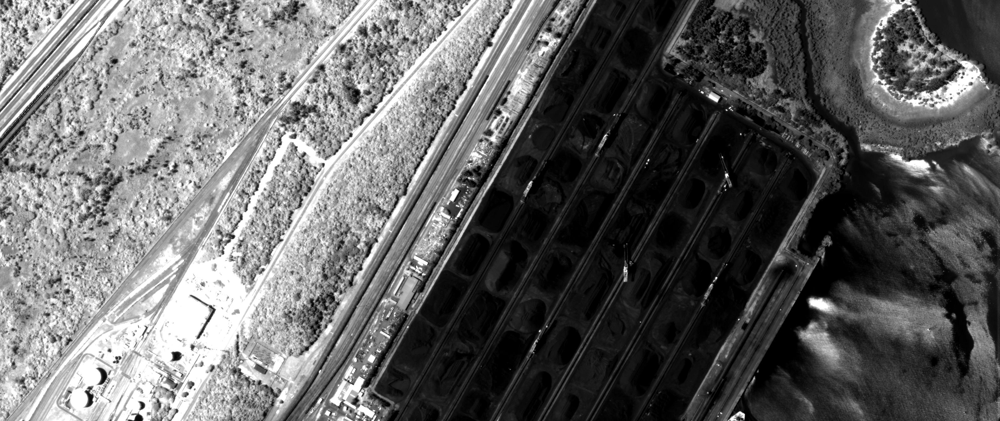
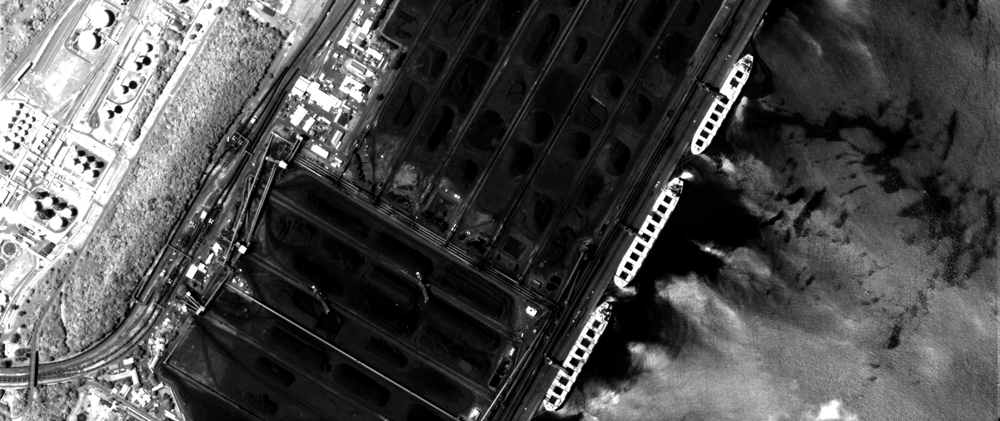
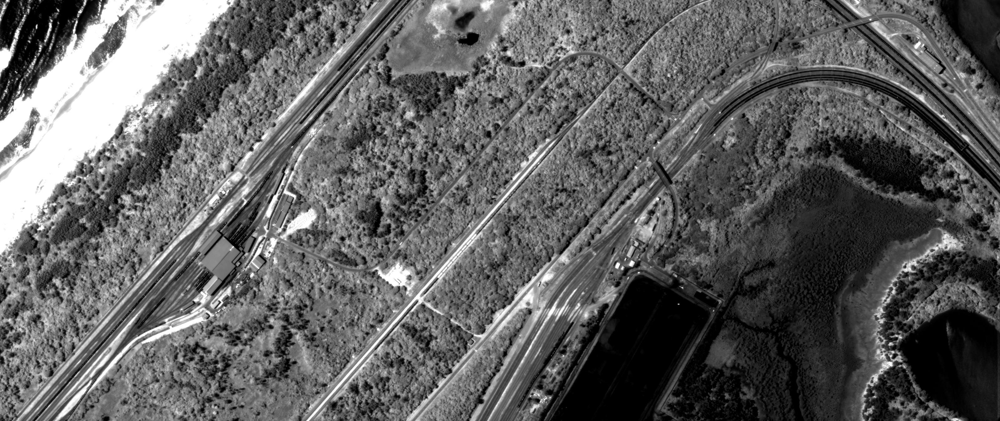
...
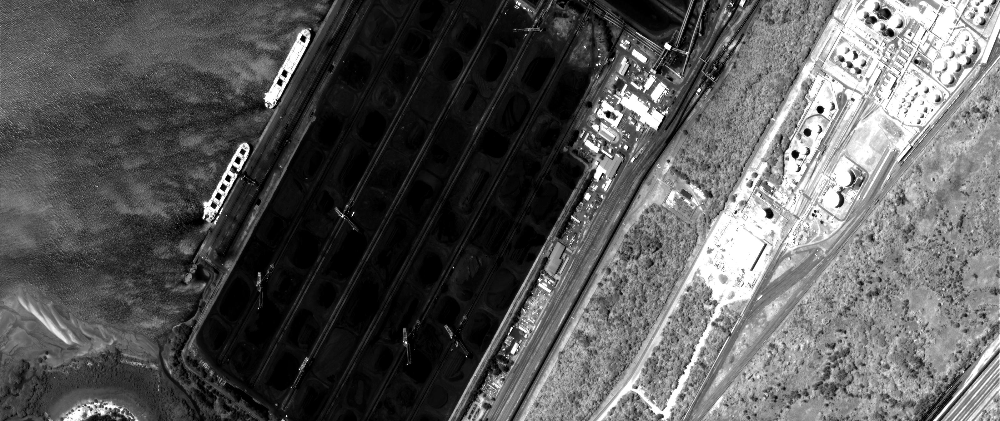
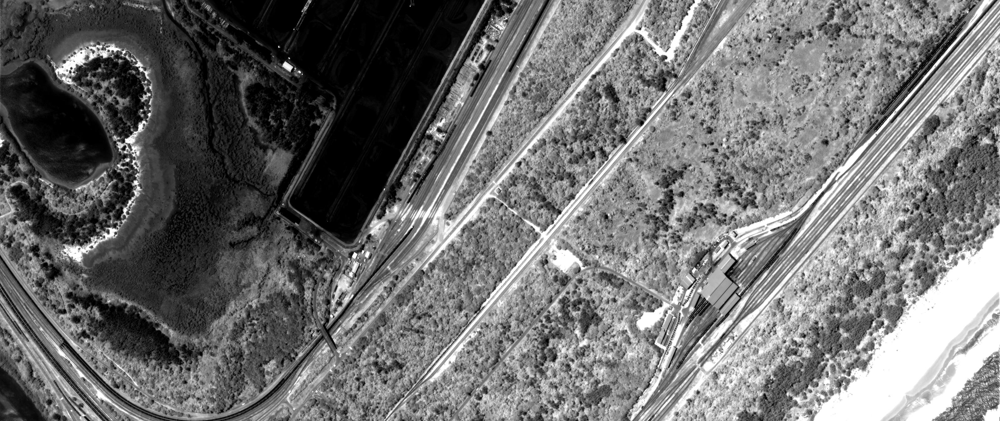
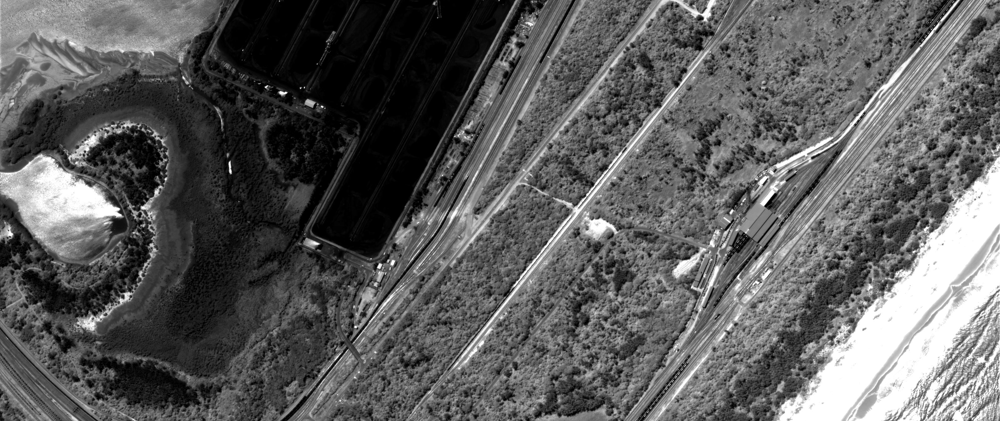
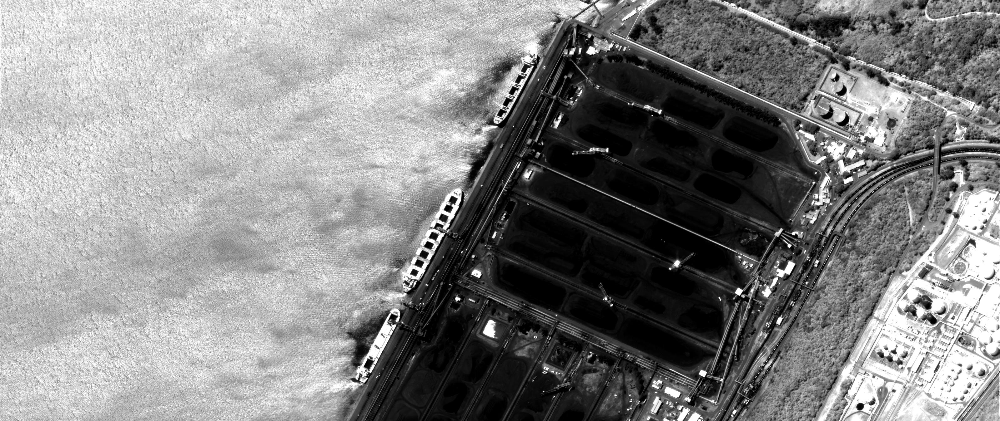
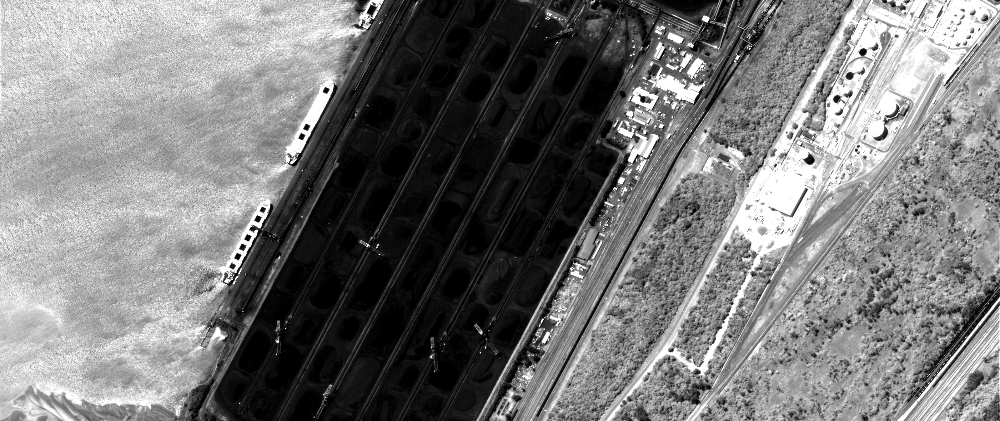

In [27]:
scene.display_crops()

In [29]:
scene.run_bruteforce_bundle_adjustment(timeline_indices, reset=True, verbose=True)

2 dates of the timeline were selected for bundle adjustment:
(1) 2020-01-16 07:55:31 --> 7 views
(2) 2020-01-29 10:38:23 --> 6 views

Running bruteforce bundle ajustment !
All dates will be adjusted together at once




Setting bundle adjustment input data...

13 new images for bundle adjustment !
Loading rpcs... 13/13
Loading geotiff crops... 13/13

...bundle adjustment input data is ready !


Bundle Adjustment Pipeline created
-------------------------------------------------------------
Configuration:
    - input_dir:    exp/coal/ba_bruteforce
    - output_dir:   exp/coal/ba_bruteforce
    - n_new:        13
    - n_adj:        0
    - cam_model:    perspective
    - fix_ref_cam:  True
-------------------------------------------------------------

Perspective projection matrix approximation... 13/13
Estimating camera positions...
...done in 0.00 seconds
Getting image footprints...
...done in 0.71 seconds


Building feature tracks - satellite scenario

Parameters:
    - FT_preprocess

    - cam  10 -  1905 obs - (mean before / mean after): 1.83 / 0.17
    - cam  11 -  1082 obs - (mean before / mean after): 1.47 / 0.28
    - cam  12 -  1492 obs - (mean before / mean after): 1.09 / 0.23


Computing 10941 points 3d from feature tracks...
...45/45 triangulation pairs done in 0.03 seconds
done!

Defining bundle adjustment parameters...
     - cam_params_to_optimize: ['R']

10941 3d points, 0 fixed and 10941 to be optimized
13 cameras, 1 fixed and 12 to be optimized
3 parameters to optimize per camera

Reprojection error threshold per camera: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0] px
Deleted 496 observations (1.76%) and 87 tracks (0.79%)
Removal of outliers based on reprojection error completed in 0.23 seconds

Running bundle adjustment...
    - loss:      linear
    - ftol:      0.0001
    - xtol:      1e-10
    - f_scale:   1.0
    - max_iter:  300
    - verbose:   1


Shape of Jacobian sparsity: 55110x32862
`ftol` termination condition is sat

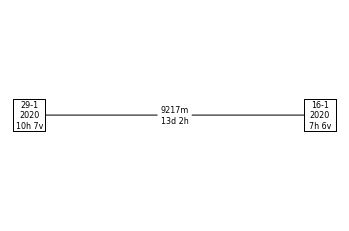

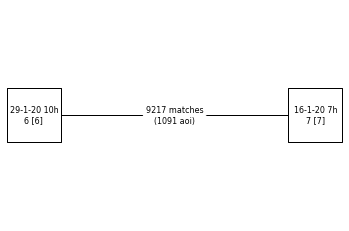

In [33]:
scene.timeline_instances_diagram(timeline_indices, scene.ba_pipeline, neighbors=1)
scene.compare_timeline_instances([timeline_indices[0]], [timeline_indices[1]], scene.ba_pipeline)

Displaying feature track with index 2257, length 3

3D location (before BA):  [ 4739537.   2967909.  -3057172.5]
3D location (after BA):   [ 4739546.92827933  2967921.05952115 -3057179.67185932] 

 --> Real 2D loc in im 3 (yellow):         [1414.95739746  137.22019958]
 --> Proj 2D loc in im 3 before BA (red):  [1413.67489239  135.28721908] (reprojection err: 2.320)
 --> Proj 2D loc in im 3 after BA (green): [1414.95437612  137.04065858] (reprojection err: 0.180)


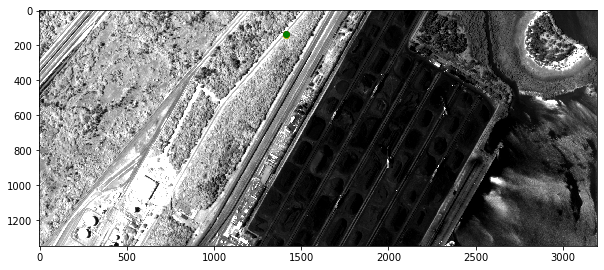

 --> Real 2D loc in im 5 (yellow):         [1387.15527344 1281.99450684]
 --> Proj 2D loc in im 5 before BA (red):  [1384.85662623 1283.0847264 ] (reprojection err: 2.544)
 --> Proj 2D loc in im 5 after BA (green): [1387.06471925 1282.15277696] (reprojection err: 0.182)


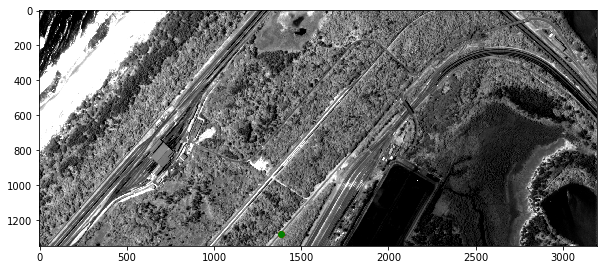

 --> Real 2D loc in im 6 (yellow):         [1448.55566406  480.88476562]
 --> Proj 2D loc in im 6 before BA (red):  [1449.43116987  480.9706852 ] (reprojection err: 0.880)
 --> Proj 2D loc in im 6 after BA (green): [1448.66001343  480.91129348] (reprojection err: 0.108)


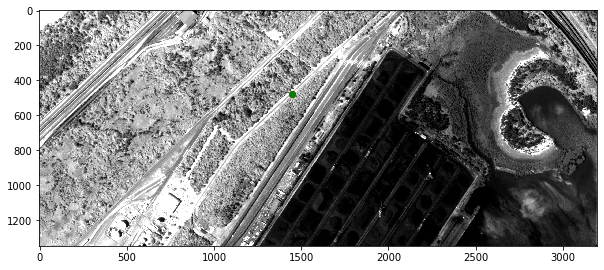

Mean reprojection error before BA: 1.915
Mean reprojection error after BA:  0.157


In [34]:
scene.ba_pipeline.visualize_feature_track()

Found 60000 keypoints in image 0 and 60000 keypoints in image 1


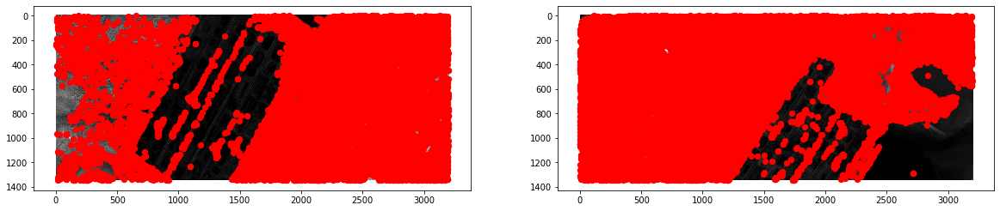

In [40]:
from .feature_tracks import ft_utils

ft_utils.plot_features_stereo_pair(0, 1, scene.ba_pipeline.features, scene.ba_pipeline.input_seq)

113 track observations to display for pair (0,1)
List of track indices: [   14    20    21   222   678  2858  3163  3207  3337  3340  4127  4518  4645  4757  4782  4928  5035  5156  5379  6797  6810  6812  6820  6823
  6825  6837  6847  6851  6858  6868  6875  6886  6888  6890  6892  6903  6905  6908  6909  6930  6931  6967  6974  6975  6978  6988  6991  7004
  7010  7025  7052  7057  7058  7067  7072  7076  7108  7110  7119  7121  7125  7156  7172  7190  7206  7214  7221  7245  7253  7255  7267  7278
  7286  7290  7297  7299  7313  7575  7724  8058  8297  8437  8512  9741  9815  9826  9856  9873  9874  9877  9957  9972 10020 10241 10270 10311
 10313 10317 10356 10368 10381 10406 10470 10490 10493 10570 10639 10656 10776 10785 10856 10928 10931]


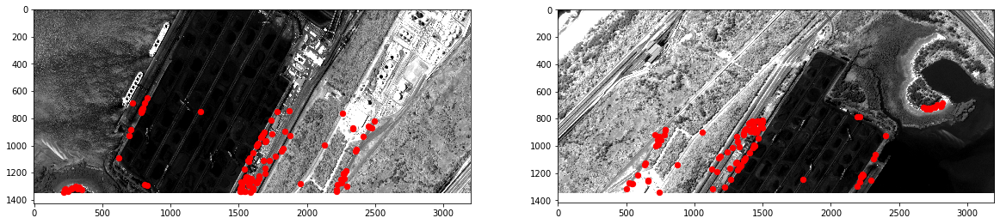

In [39]:
from .feature_tracks import ft_utils

ft_utils.plot_track_observations_stereo_pair(0, 1, scene.ba_pipeline.C,  scene.ba_pipeline.input_seq)

Connectivity graph: 0 missing cameras: []
                    1 connected components
                    54 edges
                    57 min n_matches in an edge



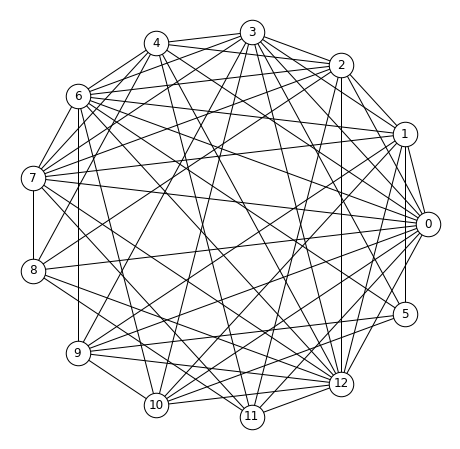

Connectivity graph: 0 missing cameras: []
                    1 connected components
                    54 edges
                    57 min n_matches in an edge



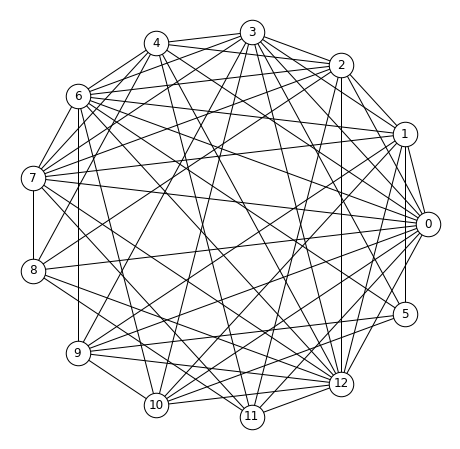

In [41]:
from bundle_adjust import ba_utils

ba_utils.plot_connectivity_graph(scene.ba_pipeline.C, 10, save_pgf=False)

ba_utils.plot_connectivity_graph(scene.ba_pipeline.C, 50, save_pgf=False)

In [44]:
scene.ba_pipeline.save_feature_tracks_as_svg(scene.dst_dir)


SIFT keypoints were saved at exp/coal/sift

Feature track observations were saved at exp/coal/feature_tracks



# Reconstruct scene

### Compute s2p DSMs with corrected RPCs

In [52]:
ba_method = 'ba_sequential'
scene.reconstruct_dates(timeline_indices, ba_method, n_s2p=10, verbose=False)


###################################################################################
Reconstructing 2 dates with s2p
Timeline indices: [51, 53]
Number of DSMs to reconstruct: 13
S2P parallel processes: 10
Output DSMs directory: exp/coal/ba_sequential/4D/dsms
###################################################################################

...(1/2) reconstructing 20200116_075531 [8 DSMs]
-----------------------------------------------------------------------------------
...reconstructing stereo DSMs (thread 6 -> 0/1)
...reconstructing stereo DSMs (thread 3 -> 0/1)
...reconstructing stereo DSMs (thread 7 -> 0/1)
...reconstructing stereo DSMs (thread 4 -> 0/1)
...reconstructing stereo DSMs (thread 5 -> 0/1)
...reconstructing stereo DSMs (thread 2 -> 0/1)
...reconstructing stereo DSMs (thread 1 -> 0/1)
...reconstructing stereo DSMs (thread 0 -> 0/1)
...reconstructing stereo DSMs (thread 6 -> 1/1)
...reconstructing stereo DSMs (thread 3 -> 1/1)
...reconstructing stereo DSMs (thread 7 -> 

In [53]:
scene.project_pts3d_adj_onto_dsms(timeline_indices, ba_method)

Projecting adjusted 3d points onto output multi-view DSMs... 1/2
Projecting adjusted 3d points onto output multi-view DSMs... 2/2




In [56]:
geotiff_label = None
ba_method = 'ba_sequential'
scene.interpolate_small_holes(timeline_indices, imscript_bin_dir='bin', 
                              ba_method=ba_method, pc3dr=False, geotiff_label=geotiff_label)


###################################################################################
Closing small holes from s2p DSMs...
  - timeline_indices: [51, 53]
###################################################################################

20200116_075531 - interpolating stereo DSMs: 8/8

20200129_103823 - interpolating stereo DSMs: 5/5



In [59]:
scene.compute_stat_per_date(timeline_indices, ba_method=ba_method, stat='avg', 
                            use_cdsms=True, clean_tmp_warps=False, pc3dr=False)


###################################################################################
Computing avg per date...
  - timeline_indices: [51, 53]
  - tile_size: 500
  - use_cdsms: True
  - pc3dr: False
###################################################################################



Computing tiles... 12/12

20200116_075531 - done computing avg multi-view DSM (1/2)

Clipping DSMs... 5/5

Computing tiles... 12/12

20200129_103823 - done computing avg multi-view DSM (2/2)



In [61]:
scene.compute_stat_per_date(timeline_indices, ba_method=ba_method, stat='std', 
                            use_cdsms=True, clean_tmp_warps=False, pc3dr=False)


###################################################################################
Computing std per date...
  - timeline_indices: [51, 53]
  - tile_size: 500
  - use_cdsms: True
  - pc3dr: False
###################################################################################



Computing tiles... 12/12

20200116_075531 - done computing std multi-view DSM (1/2)



Computing tiles... 12/12

20200129_103823 - done computing std multi-view DSM (2/2)



In [62]:
scene.compute_stats_over_time(timeline_indices, ba_method=ba_method, pc3dr=False, use_cdsms=False)


Computing 4D statistics of the timeseries! Chosen dates:
2020-01-16 07:55:31
2020-01-29 10:38:23

Done! Results were saved at exp/coal/ba_sequential/4D/metrics_over_time


In [64]:
scene.compute_dsm_registration_metrics(timeline_indices, ba_method=ba_method,
                                       over_time=True, pc3dr=False, use_cdsms=True)



******************** DSM registration metrics ********************
  - ba_method: ba_sequential
  - over_time: True
  - pc3dr: False
  - use_cdsms: True

% of points with mean std over time < 1 m: 80.151
mean std over time: 0.819
mean std over time [pts < 1 m]: 0.374
mean std per date: 0.538

detailed std per date:
(1/2) 20200116_075531:  0.675
(2/2) 20200129_103823:  0.402
******************************************************************




In [67]:
scene.run_pc3dr_datewise(timeline_indices, ba_method=ba_method, reset=True)


###################################################################################
Applying pc3dr to 2 dates
Timeline indices: [51, 53]
Number of DSMs to align: 13
Output DSMs directory: exp/coal/ba_sequential/4D/pc3dr
###################################################################################

...(1/2) pc3dr to align 20200116_075531 [8 DSMs]
...done in 00:01:48.51

...(2/2) pc3dr to align 20200129_103823 [5 DSMs]
...done in 00:01:05.06


All pc3dr runs completed in 00:02:53.59 (0 crashes)

All inter-date alignments completed in 00:00:07.03


TOTAL TIME: 00:03:00.62

